In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
df = pd.read_csv('../data/raw/star_classification.csv')

## Preliminary Data Analysis

### Repartition of the data by class

<Axes: xlabel='class', ylabel='count'>

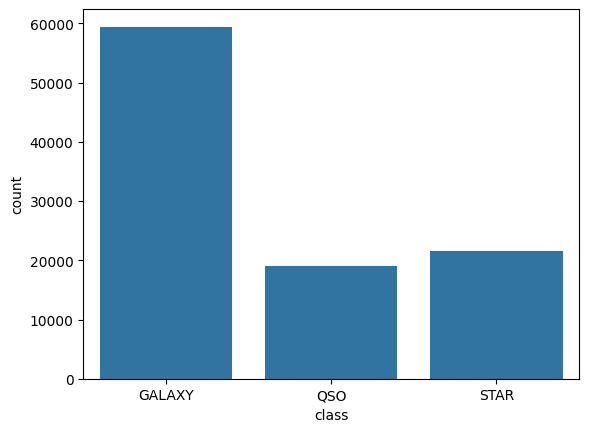

In [2]:
#repartition of the classes
sns.countplot(x='class', data=df)

### Dealing with unwanted features

obj_ID, run_ID, camcol, field_ID, rerun_ID, plate, MJD, fiber_ID, spec_obj_id columns correspond to identifier of diverse measure equipment. We drop the first 7 columns as they are not useful for our analysis. For the last column we will check for duplicates as an object can be observed more than once but it should have a unique spectrograph ID.

In [3]:
df=df.drop(['obj_ID','run_ID','rerun_ID','cam_col','field_ID','plate','MJD','fiber_ID'], axis=1)

In [4]:
# check for double entries for spec_obj_ID
print(df[df.duplicated(['spec_obj_ID'],keep='first')])

Empty DataFrame
Columns: [alpha, delta, u, g, r, i, z, spec_obj_ID, class, redshift]
Index: []


There is no duplicate in the spectrograph ID column. We can drop it. As well as Alpha and Delta as they are not useful for our analysis. (they correspond to the coordinates of the object in the sky)

In [5]:
#drop the columns that are not relevant for the classification
df=df.drop(['spec_obj_ID','alpha','delta'], axis=1)

### Visualizing the correlation between selected features

<Axes: >

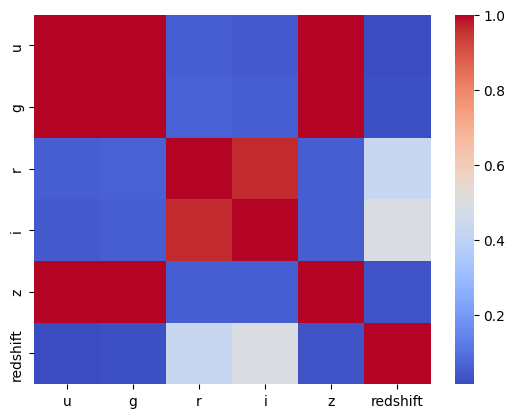

In [6]:
#correlation matrix
df_w = df.drop(['class'], axis=1)
corr = df_w.corr()
sns.heatmap(corr, annot=False, cmap='coolwarm')

### Visualizing the distribution of selected features

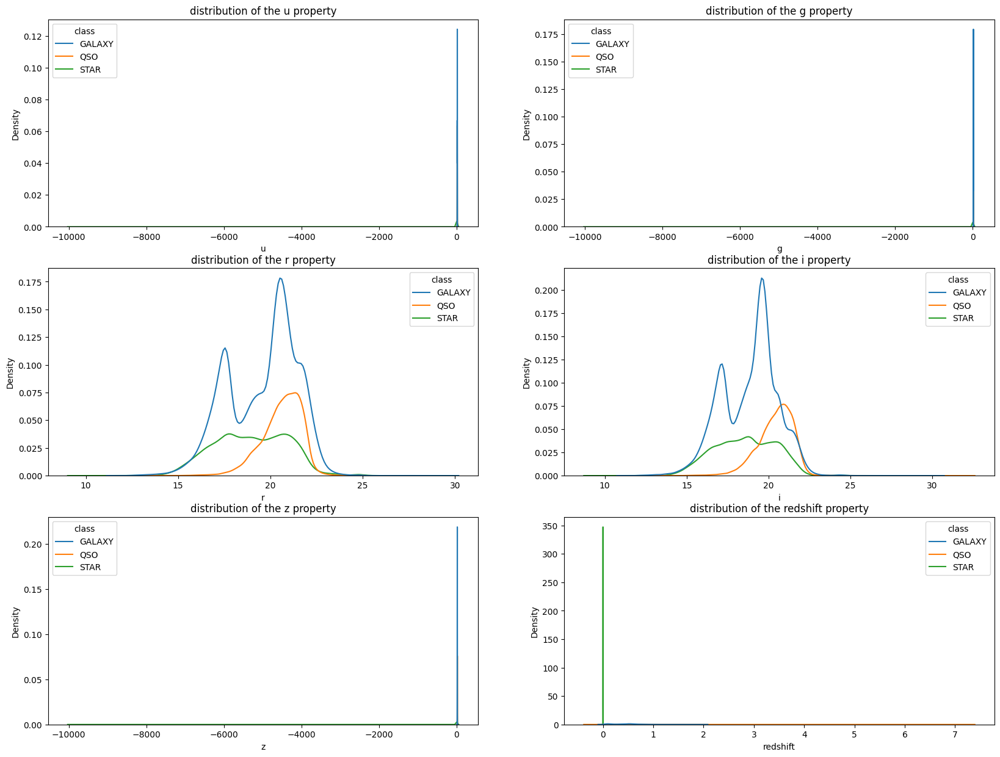

In [7]:
#data distribution
fig, axes = plt.subplots(3, 2, figsize=(20, 15))
axes = axes.flatten()
for i,var in enumerate(df_w.columns[:]):
    sns.kdeplot(data=df, x=var, hue='class', ax=axes[i])
    axes[i].set_title("distribution of the "+ var+" property")


For g, z, u and redshift we can see some abnormal values, but we can't realy see well the distribution of the data. Let's try to plot the data in log scale.

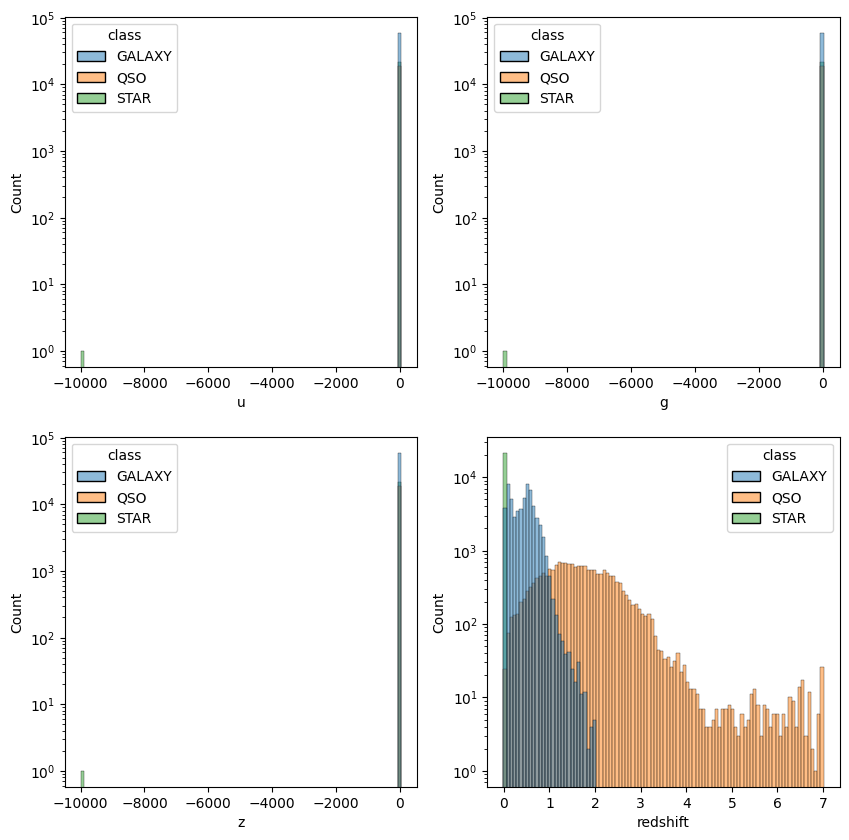

In [8]:
fig, axes = plt.subplots(2, 2, figsize=(10, 10))
axes = axes.flatten()

sns.histplot(data=df, x='u', hue='class', bins=100, ax=axes[0])
axes[0].set_yscale('log')
sns.histplot(data=df, x='g', hue='class', bins=100, ax=axes[1])
axes[1].set_yscale('log')
sns.histplot(data=df, x='z', hue='class', bins=100, ax=axes[2])
axes[2].set_yscale('log')
sns.histplot(data=df, x='redshift', hue='class', bins=100, ax=axes[3])
axes[3].set_yscale('log')


Almost every value in g, z and u are close to 0, exept for 1 point near -100000. Let's remove it. 

In [9]:
df = df[df['g'] > -2000]
df = df[df['z'] > -2000]
df = df[df['u'] > -2000]

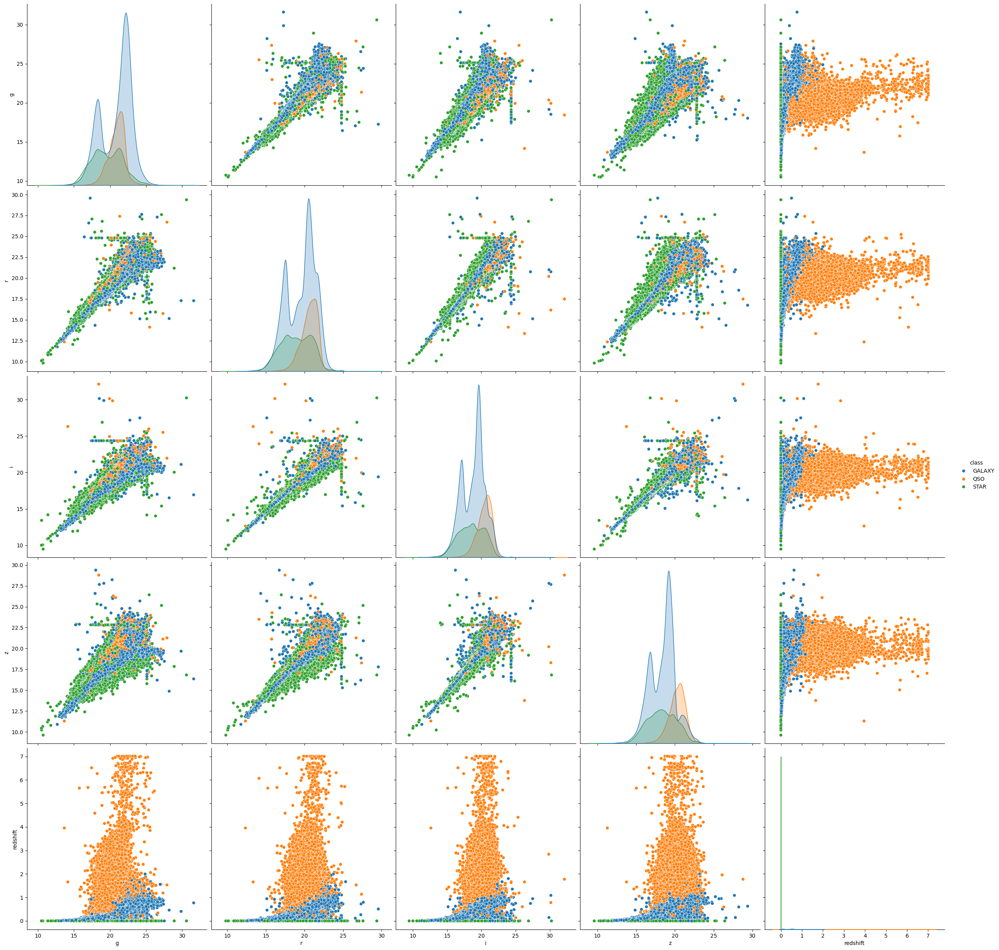

In [10]:
#show for each class the distribution of the features
sns.pairplot(df, hue='class', vars=['g','r','i','z','redshift'], height=5)


## Dealing with outliers

### Using UMAP to reduce the dimensionality of the data

In [11]:
data = df.drop(['class'], axis=1)
labels = df['class']

In [12]:
import umap
import umap.plot
reducer = umap.UMAP(set_op_mix_ratio=0.008).fit(data)

/usr/local/lib/python3.9/site-packages/umap/plot.py:203: NumbaDeprecationWarning: The keyword argument 'nopython=False' was supplied. From Numba 0.59.0 the default is being changed to True and use of 'nopython=False' will raise a warning as the argument will have no effect. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit(nopython=False)


### Detecting outliers using Local Outlier Factor

In [13]:
#detect outliers
import sklearn
from sklearn.neighbors import LocalOutlierFactor

outlier_scores = sklearn.neighbors.LocalOutlierFactor(contamination=0.1).fit_predict(reducer.embedding_)
outlying_object = data[outlier_scores == -1]

We plot the data in by class with inliners in red and detected outliers in blue.

<Axes: xlabel='0', ylabel='1'>

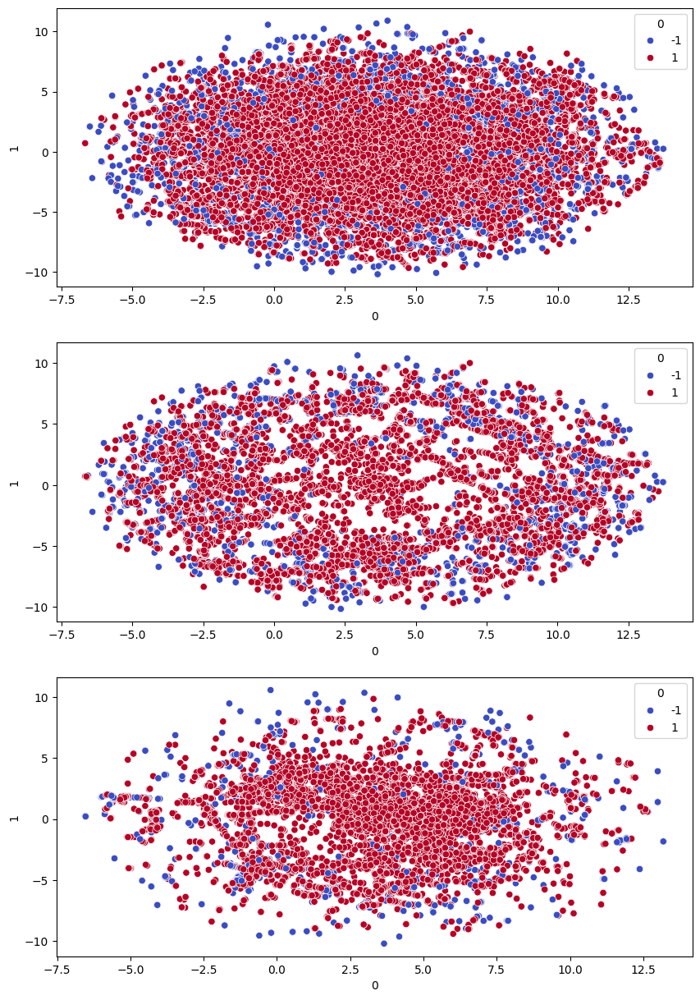

In [14]:
reducer_embedding = pd.DataFrame(reducer.embedding_)
labels = labels.reset_index(drop=True)
outlier_scores = pd.DataFrame(outlier_scores)
fig, axes = plt.subplots(3, 1, figsize=(10, 15))
axes = axes.flatten()
sns.scatterplot(data=reducer_embedding[labels=="GALAXY"], x=0, y=1, hue=outlier_scores[labels=="GALAXY"][0], palette='coolwarm', ax=axes[0])
sns.scatterplot(data=reducer_embedding[labels=="STAR"], x=0, y=1, hue=outlier_scores[labels=="STAR"][0], palette='coolwarm', ax=axes[1])
sns.scatterplot(data=reducer_embedding[labels=="QSO"], x=0, y=1, hue=outlier_scores[labels=="QSO"][0], palette='coolwarm', ax=axes[2])

### Deleting outliers from the dataset

In [15]:
outlier_scores=outlier_scores.reset_index(drop=True)
data = data.reset_index(drop=True)
labels = labels.reset_index(drop=True)
data = data[outlier_scores[0] == 1]
labels = labels[outlier_scores[0] == 1]
data = data.reset_index(drop=True)
labels = labels.reset_index(drop=True)

## Preprocessing the data and Feature Engineering

### Splitting the data into train and test sets

In [16]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(data, labels, test_size=0.2, random_state=42)

### Feature Engineering with UMAP

using UMAP to reduce the dimensionality to calculate the reducer and embedding of the train set

In [17]:
reducer_ugz = umap.UMAP(n_components=3).fit(X_train[['u','g','z']])
reducer_ri = umap.UMAP(n_components=2).fit(X_train[['r','i']])
embedding_ugz = pd.DataFrame(reducer_ugz.transform(X_train[['u','g','z']]))
embedding_ri = pd.DataFrame(reducer_ri.transform(X_train[['r','i']]))

In [18]:
data_train = pd.concat([embedding_ugz, embedding_ri,data["redshift"]], axis=1)
data_train.columns = ['ugz_1','ugz_2','ugz_3','ri_1','ri_2','redshift']
data_train = data_train.reset_index(drop=True)
y_train = y_train.reset_index(drop=True)
data_train.head()

,ugz_1,ugz_2,ugz_3,ri_1,ri_2,redshift
0,9.990141,0.742096,2.056633,3.260577,2.854112,0.779136
1,0.563809,-1.706598,11.806930,14.152891,4.740420,0.644195
2,12.657947,0.888093,9.621105,-2.611296,-8.347770,0.932346
3,10.523723,2.278101,14.020317,3.452960,-5.817367,0.116123
4,8.066700,-1.772970,0.108616,-0.388205,2.485283,1.424659


### Scaling the data

we use robust scaler to scale the data

In [19]:
from sklearn.preprocessing import RobustScaler
scaler = RobustScaler().fit(data_train)
data_train = scaler.transform(data_train)
data_train = pd.DataFrame(data_train)
data_train.columns = ['ugz_1','ugz_2','ugz_3','ri_1','ri_2','redshift']
data_train.head()

,ugz_1,ugz_2,ugz_3,ri_1,ri_2,redshift
0,0.020529,-0.206932,-0.665293,0.036526,-0.117559,0.494550
1,-1.114589,-0.554135,0.654654,0.869752,0.022176,0.288603
2,0.341786,-0.186231,0.358748,-0.412654,-0.947382,0.728378
3,0.084783,0.010860,0.954291,0.051242,-0.759933,-0.517338
4,-0.211091,-0.563545,-0.929006,-0.242595,-0.144882,1.479745


## Visualizing final data

<Axes: >

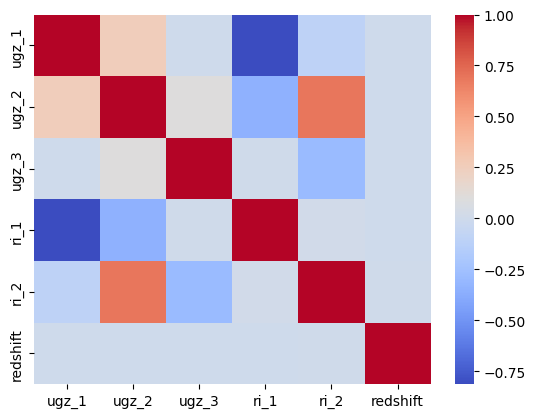

In [20]:
#correlation matrix
corr = data_train.corr()
sns.heatmap(corr, annot=False, cmap='coolwarm')

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


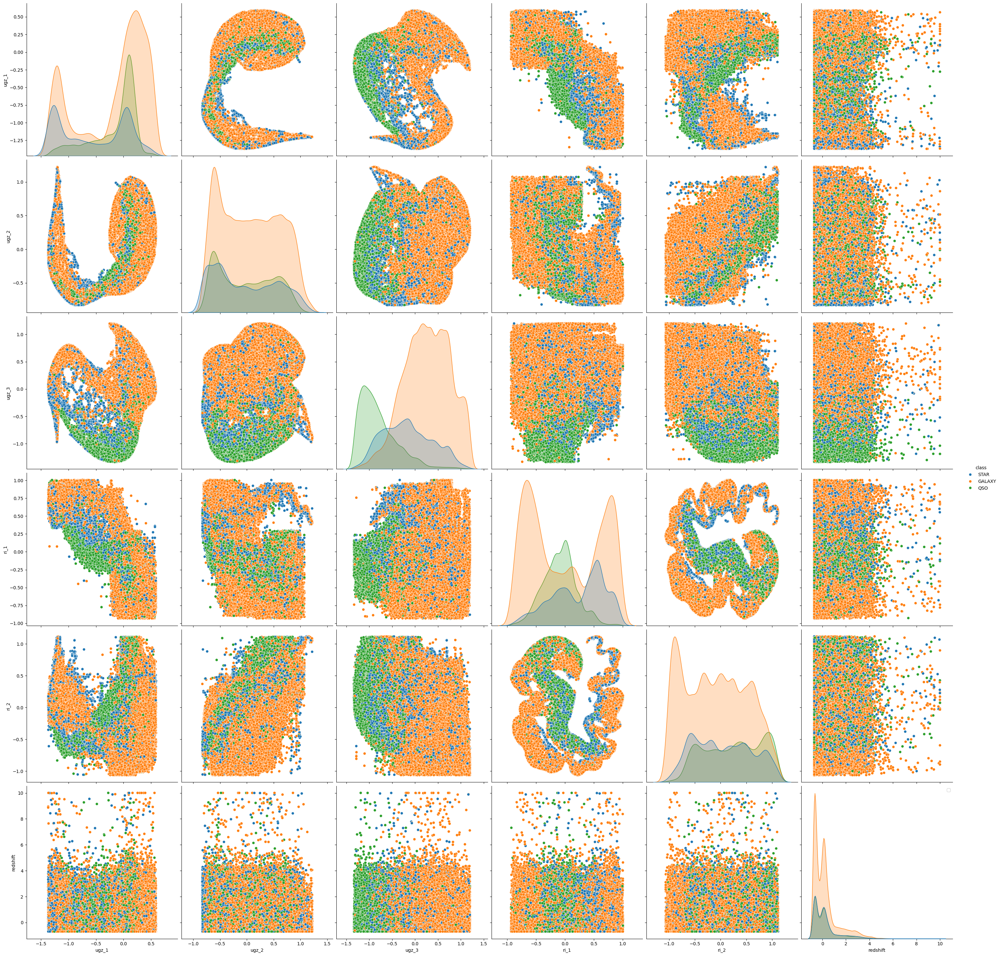

In [23]:
#pairplot
data_train['class'] = y_train
sns.pairplot(data_train, hue='class', vars=['ugz_1','ugz_2','ugz_3','ri_1','ri_2','redshift'], height=5)
plt.legend(loc='upper right')